<a href="https://colab.research.google.com/github/dayananikol/CCADMACL_EXAM_COM222ML/blob/main/Danga_Midterm_Exam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CCADMACL (Midterm Exam)

## Import the libraries

In [835]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

from collections import Counter

## Load the datasets

In [836]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")

## Plot the datasets

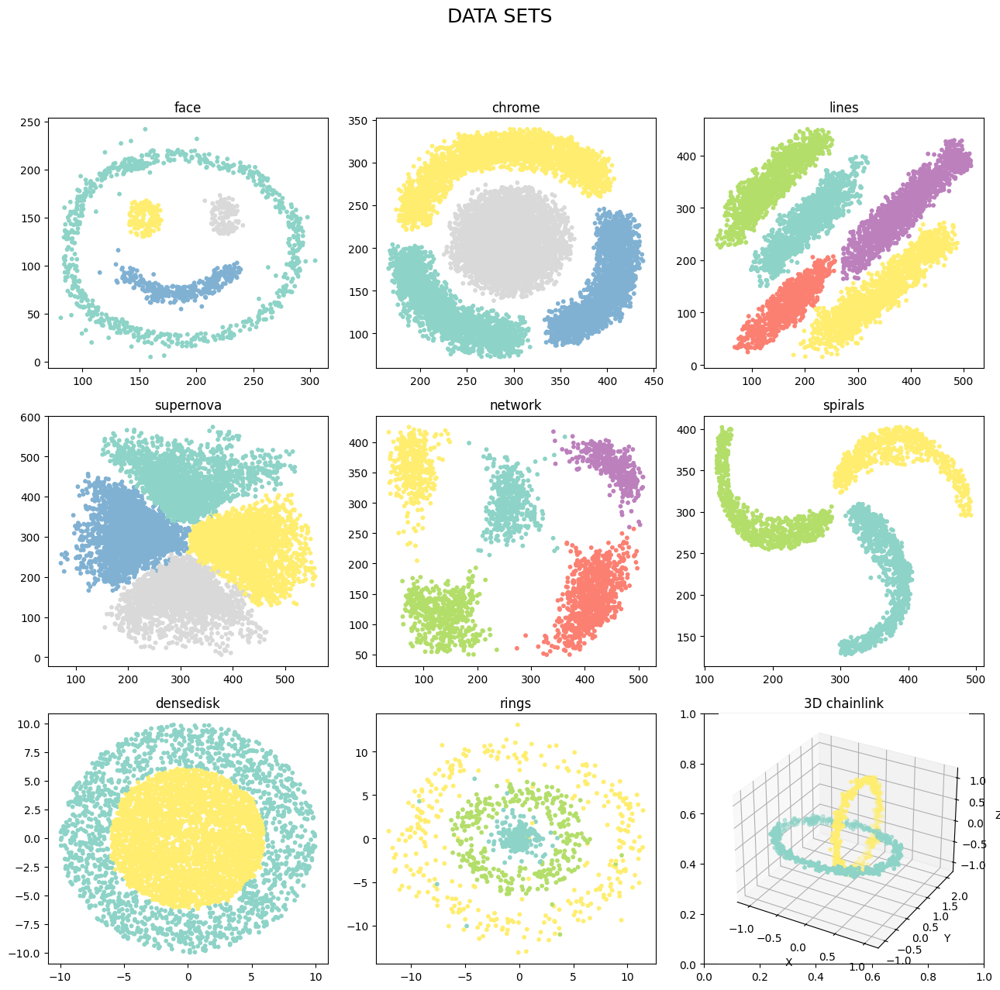

In [837]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
fig.suptitle('DATA SETS\n', size=18)

# Plot the 2D scatterplots
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("rings")

# Add a 3D plot
ax3d = fig.add_subplot(3, 3, 9, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

## A. Use K-means to cluster each dataset

1. Create each copy of the dataset for k-means

In [838]:
face_df1 = face_df.copy()
chrome_df1 = chrome_df.copy()
lines2_df1 = lines2_df.copy()
supernova_df1 = supernova_df.copy()
network_df1 = network_df.copy()
spirals_df1 = spirals_df.copy()
densedisk_df1 = densedisk_df.copy()
rings_df1 = rings_df.copy()
chainlink_df1 = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [839]:
face_df1.drop('color', axis=1, inplace =True)
chrome_df1.drop('color', axis=1, inplace =True)
lines2_df1.drop('color', axis=1, inplace =True)
supernova_df1.drop('color', axis=1, inplace =True)
network_df1.drop('color', axis=1, inplace =True)
spirals_df1.drop('color', axis=1, inplace =True)
densedisk_df1.drop('color', axis=1, inplace =True)
rings_df1.drop('color', axis=1, inplace =True)
chainlink_df1.drop('color', axis=1, inplace =True)

3. Train a K-means model for each dataset.

In [840]:
# from sklearn.cluster import KMeans
# wcss = []
# for i in range(1, 11):
#     kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
#     kmeans.fit(face_df1,chrome_df1,  )
#     wcss.append(kmeans.inertia_)
# plt.plot(range(1, 11), wcss)
# plt.title('The Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('WCSS')
# plt.show()

In [841]:
kmeans_face = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans_face = kmeans_face.fit_predict(face_df1)

kmeans_chrome = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans_chrome = kmeans_chrome.fit_predict(chrome_df1)

kmeans_lines2 = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans_lines2 = kmeans_lines2.fit_predict(lines2_df1)

kmeans_supernova = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans_supernova = kmeans_supernova.fit_predict(supernova_df1)

kmeans_network = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans_network = kmeans_network.fit_predict(network_df1)

kmeans_spirals = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans_spirals = kmeans_spirals.fit_predict(spirals_df1)

kmeans_densedisk = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
y_kmeans_densedisk = kmeans_densedisk.fit_predict(densedisk_df1)

kmeans_rings = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans_rings = kmeans_rings.fit_predict(rings_df1)

kmeans_chainlink = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
y_kmeans_chainlink = kmeans_chainlink.fit_predict(chainlink_df1)

4. Add a "Cluster" column for each data set

In [842]:
# Creating 'Cluster' columns in data sets
face_df1['Cluster'] = y_kmeans_face
chrome_df1['Cluster'] = y_kmeans_chrome
lines2_df1['Cluster'] = y_kmeans_lines2
supernova_df1['Cluster'] = y_kmeans_supernova
network_df1['Cluster'] = y_kmeans_network
spirals_df1['Cluster'] = y_kmeans_spirals
densedisk_df1['Cluster'] = y_kmeans_densedisk
rings_df1['Cluster'] = y_kmeans_rings
chainlink_df1['Cluster'] = y_kmeans_chainlink

5. Plot the Correct cluster and the K-means cluster

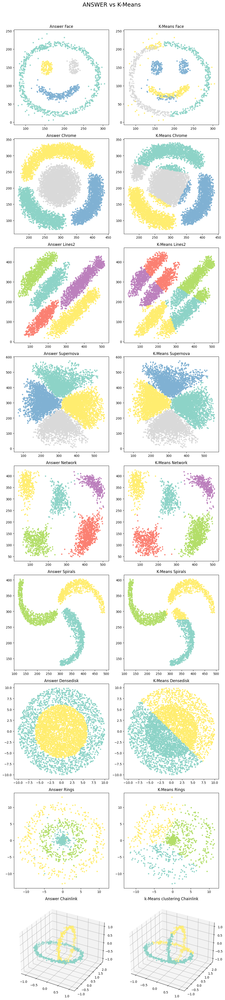

In [843]:
fig, axes = plt.subplots(nrows=9, ncols=2,figsize=(10,45), subplot_kw={'projection': None}) # Changed nrows to 9 to accommodate all datasets
fig.suptitle('ANSWER vs K-Means', size = 18)

axes[0,0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Answer Face");
axes[0,1].scatter(face_df1['x'], face_df1['y'], c=face_df1['Cluster'], s=10, cmap = "Set3")
axes[0,1].set_title("K-Means Face");

axes[1,0].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Answer Chrome");
axes[1,1].scatter(chrome_df1['x'], chrome_df1['y'], c=chrome_df1['Cluster'], s=10, cmap = "Set3")
axes[1,1].set_title("K-Means Chrome");

axes[2,0].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap = "Set3")
axes[2,0].set_title("Answer Lines2"); # Corrected title
axes[2,1].scatter(lines2_df1['x'], lines2_df1['y'], c=lines2_df1['Cluster'], s=10, cmap = "Set3")
axes[2,1].set_title("K-Means Lines2"); # Corrected title

axes[3,0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap = "Set3")
axes[3,0].set_title("Answer Supernova");
axes[3,1].scatter(supernova_df1['x'], supernova_df1['y'], c=supernova_df1['Cluster'], s=10, cmap = "Set3")
axes[3,1].set_title("K-Means Supernova");

axes[4,0].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap = "Set3")
axes[4,0].set_title("Answer Network");
axes[4,1].scatter(network_df1['x'], network_df1['y'], c=network_df1['Cluster'], s=10, cmap = "Set3")
axes[4,1].set_title("K-Means Network");

axes[5,0].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap = "Set3")
axes[5,0].set_title("Answer Spirals");
axes[5,1].scatter(spirals_df1['x'], spirals_df1['y'], c=spirals_df1['Cluster'], s=10, cmap = "Set3")
axes[5,1].set_title("K-Means Spirals");

axes[6,0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap = "Set3")
axes[6,0].set_title("Answer Densedisk");
axes[6,1].scatter(densedisk_df1['x'], densedisk_df1['y'], c=densedisk_df1['Cluster'], s=10, cmap = "Set3")
axes[6,1].set_title("K-Means Densedisk");

axes[7,0].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap = "Set3")
axes[7,0].set_title("Answer Rings");
axes[7,1].scatter(rings_df1['x'], rings_df1['y'], c=rings_df1['Cluster'], s=10, cmap = "Set3")
axes[7,1].set_title("K-Means Rings");

axes[8,0].scatter(chainlink_df['x'], chainlink_df['y'], c=chainlink_df['color'], s=10, cmap = "Set3")
axes[8,0].set_title("Answer Chainlink"); # Corrected title
axes[8,1].scatter(chainlink_df1['x'], chainlink_df1['y'], c=chainlink_df1['Cluster'], s=10, cmap = "Set3")
axes[8,1].set_title("K-Means Chainlink");

# 3D scatter plot for chainlink
fig.delaxes(axes[8, 0])  # Remove the placeholder 2D axes
fig.delaxes(axes[8, 1])  # Remove the placeholder 2D axes
ax_chainlink_ans = fig.add_subplot(9, 2, 17, projection='3d')  # 3D plot for Answer Chainlink
ax_chainlink_ans.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], s=10, cmap="Set3")
ax_chainlink_ans.set_title("Answer Chainlink")

ax_chainlink_clust = fig.add_subplot(9, 2, 18, projection='3d')  # 3D plot for Hierarchical clustering Chainlink
ax_chainlink_clust.scatter(chainlink_df1['x'], chainlink_df1['y'], chainlink_df1['z'], c=chainlink_df1['Cluster'], s=10, cmap="Set3")
ax_chainlink_clust.set_title("k-Means clustering Chainlink")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout for title
plt.show()

## B. Use Agglomerative Clustering to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [844]:
face_df2 = face_df.copy()
chrome_df2 = chrome_df.copy()
lines2_df2 = lines2_df.copy()
supernova_df2 = supernova_df.copy()
network_df2 = network_df.copy()
spirals_df2 = spirals_df.copy()
densedisk_df2 = densedisk_df.copy()
rings_df2 = rings_df.copy()
chainlink_df2 = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [845]:
face_df2.drop('color', axis=1, inplace =True)
chrome_df2.drop('color', axis=1, inplace =True)
lines2_df2.drop('color', axis=1, inplace =True)
supernova_df2.drop('color', axis=1, inplace =True)
network_df2.drop('color', axis=1, inplace =True)
spirals_df2.drop('color', axis=1, inplace =True)
densedisk_df2.drop('color', axis=1, inplace =True)
rings_df2.drop('color', axis=1, inplace =True)
chainlink_df2.drop('color', axis=1, inplace =True)

3. Train a Agglomerative Clustering model for each dataset.

In [846]:
from sklearn.cluster import AgglomerativeClustering

# Training model
AgglomerativeC_face = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_face = AgglomerativeC_face.fit_predict(face_df2)

AgglomerativeC_chrome = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_chrome = AgglomerativeC_chrome.fit_predict(chrome_df2)

AgglomerativeC_lines2 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_lines2 = AgglomerativeC_lines2.fit_predict(lines2_df2)

AgglomerativeC_supernova = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_supernova = AgglomerativeC_supernova.fit_predict(supernova_df2)

AgglomerativeC_network = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_network = AgglomerativeC_network.fit_predict(network_df2)

AgglomerativeC_spirals= AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_spirals = AgglomerativeC_spirals.fit_predict(spirals_df2)

AgglomerativeC_densedisk = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_densedisk = AgglomerativeC_densedisk.fit_predict(densedisk_df2)

AgglomerativeC_rings = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_rings = AgglomerativeC_rings.fit_predict(rings_df2)

AgglomerativeC_chainlink = AgglomerativeClustering(n_clusters=62, metric='euclidean', linkage = 'ward')
y_AgglomerativeC_chainlink = AgglomerativeC_chainlink.fit_predict(chainlink_df2)

4. Add a "Cluster" column for each data set

In [847]:
face_df2['Cluster'] = y_AgglomerativeC_face
chrome_df2['Cluster'] = y_AgglomerativeC_chrome
lines2_df2['Cluster'] = y_AgglomerativeC_lines2
supernova_df2['Cluster'] = y_AgglomerativeC_supernova
network_df2['Cluster'] = y_AgglomerativeC_network
spirals_df2['Cluster'] = y_AgglomerativeC_spirals
densedisk_df2['Cluster'] = y_AgglomerativeC_densedisk
rings_df2['Cluster'] = y_AgglomerativeC_rings
chainlink_df2['Cluster'] = y_AgglomerativeC_chainlink

5. Plot the Correct cluster and the Agglomerative cluster

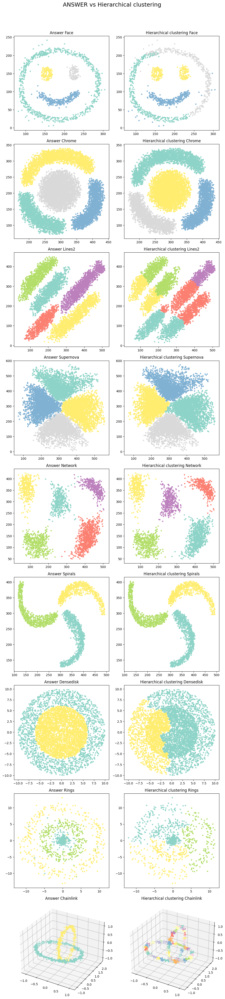

In [848]:
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting

fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(10, 45), subplot_kw={'projection': None})
fig.suptitle('ANSWER vs Hierarchical clustering\n', size=18)

# 2D plots for the first 8 datasets
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Answer Face")
axes[0, 1].scatter(face_df2['x'], face_df2['y'], c=face_df2['Cluster'], s=10, cmap="Set3")
axes[0, 1].set_title("Hierarchical clustering Face")

axes[1, 0].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Answer Chrome")
axes[1, 1].scatter(chrome_df2['x'], chrome_df2['y'], c=chrome_df2['Cluster'], s=10, cmap="Set3")
axes[1, 1].set_title("Hierarchical clustering Chrome")

axes[2, 0].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Answer Lines2")
axes[2, 1].scatter(lines2_df2['x'], lines2_df2['y'], c=lines2_df2['Cluster'], s=10, cmap="Set3")
axes[2, 1].set_title("Hierarchical clustering Lines2")

axes[3, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[3, 0].set_title("Answer Supernova")
axes[3, 1].scatter(supernova_df2['x'], supernova_df2['y'], c=supernova_df2['Cluster'], s=10, cmap="Set3")
axes[3, 1].set_title("Hierarchical clustering Supernova")

axes[4, 0].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[4, 0].set_title("Answer Network")
axes[4, 1].scatter(network_df2['x'], network_df2['y'], c=network_df2['Cluster'], s=10, cmap="Set3")
axes[4, 1].set_title("Hierarchical clustering Network")

axes[5, 0].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[5, 0].set_title("Answer Spirals")
axes[5, 1].scatter(spirals_df2['x'], spirals_df2['y'], c=spirals_df2['Cluster'], s=10, cmap="Set3")
axes[5, 1].set_title("Hierarchical clustering Spirals")

axes[6, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[6, 0].set_title("Answer Densedisk")
axes[6, 1].scatter(densedisk_df2['x'], densedisk_df2['y'], c=densedisk_df2['Cluster'], s=10, cmap="Set3")
axes[6, 1].set_title("Hierarchical clustering Densedisk")

axes[7, 0].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[7, 0].set_title("Answer Rings")
axes[7, 1].scatter(rings_df2['x'], rings_df2['y'], c=rings_df2['Cluster'], s=10, cmap="Set3")
axes[7, 1].set_title("Hierarchical clustering Rings")

# 3D scatter plot for chainlink
fig.delaxes(axes[8, 0])  # Remove the placeholder 2D axes
fig.delaxes(axes[8, 1])  # Remove the placeholder 2D axes
ax_chainlink_ans = fig.add_subplot(9, 2, 17, projection='3d')  # 3D plot for Answer Chainlink
ax_chainlink_ans.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], s=10, cmap="Set3")
ax_chainlink_ans.set_title("Answer Chainlink")

ax_chainlink_clust = fig.add_subplot(9, 2, 18, projection='3d')  # 3D plot for Hierarchical clustering Chainlink
ax_chainlink_clust.scatter(chainlink_df2['x'], chainlink_df2['y'], chainlink_df2['z'], c=chainlink_df2['Cluster'], s=10, cmap="Set3")
ax_chainlink_clust.set_title("Hierarchical clustering Chainlink")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout for title
plt.show()


## C. Use DBSCAN to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [849]:
face_df3 = face_df.copy()
chrome_df3 = chrome_df.copy()
lines2_df3 = lines2_df.copy()
supernova_df3 = supernova_df.copy()
network_df3 = network_df.copy()
spirals_df3 = spirals_df.copy()
densedisk_df3 = densedisk_df.copy()
rings_df3 = rings_df.copy()
chainlink_df3 = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [850]:
face_df3.drop('color', axis=1, inplace =True)
chrome_df3.drop('color', axis=1, inplace =True)
lines2_df3.drop('color', axis=1, inplace =True)
supernova_df3.drop('color', axis=1, inplace =True)
network_df3.drop('color', axis=1, inplace =True)
spirals_df3.drop('color', axis=1, inplace =True)
densedisk_df3.drop('color', axis=1, inplace =True)
rings_df3.drop('color', axis=1, inplace =True)
chainlink_df3.drop('color', axis=1, inplace =True)

3. Train a DBSCAN Clustering model for each dataset.

In [851]:
from sklearn.cluster import DBSCAN

dbscan_face = DBSCAN(eps=35, min_samples=8, metric='euclidean') #almost perfect
y_DBScan_face = dbscan_face.fit_predict(face_df3)

dbscan_chrome = DBSCAN(eps=10, min_samples=5, metric='euclidean') #perfect
y_DBScan_chrome = dbscan_chrome.fit_predict(chrome_df3)

dbscan_lines2 = DBSCAN(eps=13, min_samples=10, metric='euclidean') #almost
y_DBScan_lines2 = dbscan_lines2.fit_predict(lines2_df3)

dbscan_supernova = DBSCAN(eps=15, min_samples=55, metric='euclidean') # halfway
y_DBScan_supernova = dbscan_supernova.fit_predict(supernova_df3)

dbscan_network = DBSCAN(eps=15.943342, min_samples=8, metric='euclidean') #almost
y_DBScan_network = dbscan_network.fit_predict(network_df3)

dbscan_spirals = DBSCAN(eps=20, min_samples=9, metric='euclidean') #perfect
y_DBScan_spirals = dbscan_spirals.fit_predict(spirals_df3)

dbscan_densedisk = DBSCAN(eps=0.5299999, min_samples=18, metric='euclidean') #almost
y_DBScan_densedisk = dbscan_densedisk.fit_predict(densedisk_df3)

dbscan_rings = DBSCAN(eps=1, min_samples=8, metric='euclidean')
y_DBScan_rings = dbscan_rings.fit_predict(rings_df3)

dbscan_chainlink = DBSCAN(eps=0.5, min_samples=5, metric='euclidean') #perfect
y_DBScan_chainlink = dbscan_chainlink.fit_predict(chainlink_df3)

4. Add a "Cluster" column for each data set

In [852]:
face_df3['Cluster'] = y_DBScan_face
chrome_df3['Cluster'] = y_DBScan_chrome
lines2_df3['Cluster'] = y_DBScan_lines2
supernova_df3['Cluster'] = y_DBScan_supernova
network_df3['Cluster'] = y_DBScan_network
spirals_df3['Cluster'] = y_DBScan_spirals
densedisk_df3['Cluster'] = y_DBScan_densedisk
rings_df3['Cluster'] = y_DBScan_rings
chainlink_df3['Cluster'] = y_DBScan_chainlink

5. Plot the Correct cluster and the DBSCAN cluster

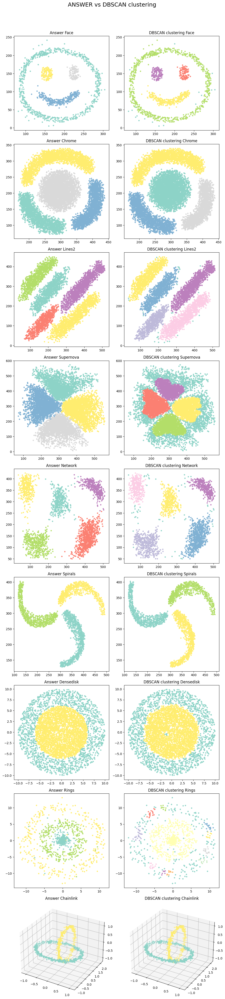

In [853]:
fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(10, 45), subplot_kw={'projection': None})
fig.suptitle('ANSWER vs DBSCAN clustering\n', size=18)

# Face dataset
axes[0,0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0,0].set_title("Answer Face")
axes[0,1].scatter(face_df3['x'], face_df3['y'], c=face_df3['Cluster'], s=10, cmap="Set3")
axes[0,1].set_title("DBSCAN clustering Face")

# Chrome dataset
axes[1,0].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[1,0].set_title("Answer Chrome")
axes[1,1].scatter(chrome_df3['x'], chrome_df3['y'], c=chrome_df3['Cluster'], s=10, cmap="Set3")
axes[1,1].set_title("DBSCAN clustering Chrome")

# Lines2 dataset
axes[2,0].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[2,0].set_title("Answer Lines2")
axes[2,1].scatter(lines2_df3['x'], lines2_df3['y'], c=lines2_df3['Cluster'], s=10, cmap="Set3")
axes[2,1].set_title("DBSCAN clustering Lines2")

# Supernova dataset
axes[3,0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[3,0].set_title("Answer Supernova")
axes[3,1].scatter(supernova_df3['x'], supernova_df3['y'], c=supernova_df3['Cluster'], s=10, cmap="Set3")
axes[3,1].set_title("DBSCAN clustering Supernova")

# Network dataset
axes[4,0].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[4,0].set_title("Answer Network")
axes[4,1].scatter(network_df3['x'], network_df3['y'], c=network_df3['Cluster'], s=10, cmap="Set3")
axes[4,1].set_title("DBSCAN clustering Network")

# Spirals dataset
axes[5,0].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[5,0].set_title("Answer Spirals")
axes[5,1].scatter(spirals_df3['x'], spirals_df3['y'], c=spirals_df3['Cluster'], s=10, cmap="Set3")
axes[5,1].set_title("DBSCAN clustering Spirals")

# Densedisk dataset
axes[6,0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[6,0].set_title("Answer Densedisk")
axes[6,1].scatter(densedisk_df3['x'], densedisk_df3['y'], c=densedisk_df3['Cluster'], s=10, cmap="Set3")
axes[6,1].set_title("DBSCAN clustering Densedisk")

# Rings dataset
axes[7,0].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[7,0].set_title("Answer Rings")
axes[7,1].scatter(rings_df3['x'], rings_df3['y'], c=rings_df3['Cluster'], s=10, cmap="Set3")
axes[7,1].set_title("DBSCAN clustering Rings")

# Chainlink dataset
axes[8,0].scatter(chainlink_df['x'], chainlink_df['y'], c=chainlink_df['color'], s=10, cmap="Set3")
axes[8,0].set_title("Answer Chainlink")
axes[8,1].scatter(chainlink_df3['x'], chainlink_df3['y'], c=chainlink_df3['Cluster'], s=10, cmap="Set3")
axes[8,1].set_title("DBSCAN clustering Chainlink")


# 3D scatter plot for chainlink
fig.delaxes(axes[8, 0])  # Remove the placeholder 2D axes
fig.delaxes(axes[8, 1])  # Remove the placeholder 2D axes
ax_chainlink_ans = fig.add_subplot(9, 2, 17, projection='3d')  # 3D plot for Answer Chainlink
ax_chainlink_ans.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], s=10, cmap="Set3")
ax_chainlink_ans.set_title("Answer Chainlink")

ax_chainlink_clust = fig.add_subplot(9, 2, 18, projection='3d')  # 3D plot for Hierarchical clustering Chainlink
ax_chainlink_clust.scatter(chainlink_df3['x'], chainlink_df3['y'], chainlink_df3['z'], c=chainlink_df3['Cluster'], s=10, cmap="Set3")
ax_chainlink_clust.set_title("DBSCAN clustering Chainlink")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout for title
plt.show()


## D. Compare all algorithms

1. Display the Correct cluster, K-means cluster, Agglomerative cluster and DBSCAN cluster in a single plot.

- Each row should contain each dataset
- Each column should contain each the correct cluster, k-means cluster, agglomerative cluster and DBSCAN cluster.

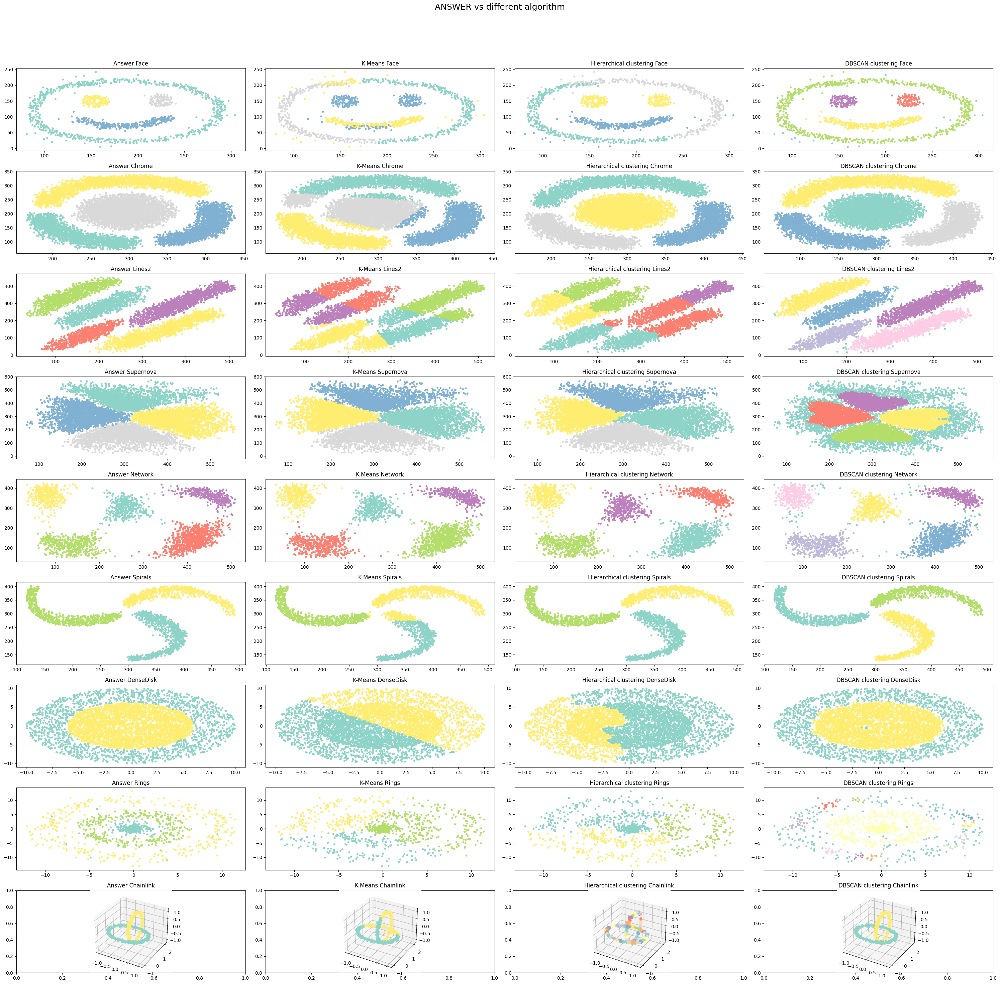

In [854]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting

fig, axes = plt.subplots(nrows=9, ncols=4, figsize=(30, 30))
fig.suptitle('ANSWER vs different algorithm\n', size=18)

axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Answer Face")
axes[0, 1].scatter(face_df1['x'], face_df1['y'], c=face_df1['Cluster'], s=10, cmap="Set3")
axes[0, 1].set_title("K-Means Face")
axes[0, 2].scatter(face_df2['x'], face_df2['y'], c=face_df2['Cluster'], s=10, cmap="Set3")
axes[0, 2].set_title("Hierarchical clustering Face")
axes[0, 3].scatter(face_df3['x'], face_df3['y'], c=face_df3['Cluster'], s=10, cmap="Set3")
axes[0, 3].set_title("DBSCAN clustering Face")

axes[1, 0].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Answer Chrome")
axes[1, 1].scatter(chrome_df1['x'], chrome_df1['y'], c=chrome_df1['Cluster'], s=10, cmap="Set3")
axes[1, 1].set_title("K-Means Chrome")
axes[1, 2].scatter(chrome_df2['x'], chrome_df2['y'], c=chrome_df2['Cluster'], s=10, cmap="Set3")
axes[1, 2].set_title("Hierarchical clustering Chrome")
axes[1, 3].scatter(chrome_df3['x'], chrome_df3['y'], c=chrome_df3['Cluster'], s=10, cmap="Set3")
axes[1, 3].set_title("DBSCAN clustering Chrome")

axes[2, 0].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Answer Lines2")
axes[2, 1].scatter(lines2_df1['x'], lines2_df1['y'], c=lines2_df1['Cluster'], s=10, cmap="Set3")
axes[2, 1].set_title("K-Means Lines2")
axes[2, 2].scatter(lines2_df2['x'], lines2_df2['y'], c=lines2_df2['Cluster'], s=10, cmap="Set3")
axes[2, 2].set_title("Hierarchical clustering Lines2")
axes[2, 3].scatter(lines2_df3['x'], lines2_df3['y'], c=lines2_df3['Cluster'], s=10, cmap="Set3")
axes[2, 3].set_title("DBSCAN clustering Lines2")

axes[3, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[3, 0].set_title("Answer Supernova")
axes[3, 1].scatter(supernova_df1['x'], supernova_df1['y'], c=supernova_df1['Cluster'], s=10, cmap="Set3")
axes[3, 1].set_title("K-Means Supernova")
axes[3, 2].scatter(supernova_df2['x'], supernova_df2['y'], c=supernova_df2['Cluster'], s=10, cmap="Set3")
axes[3, 2].set_title("Hierarchical clustering Supernova")
axes[3, 3].scatter(supernova_df3['x'], supernova_df3['y'], c=supernova_df3['Cluster'], s=10, cmap="Set3")
axes[3, 3].set_title("DBSCAN clustering Supernova")

axes[4, 0].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[4, 0].set_title("Answer Network")
axes[4, 1].scatter(network_df1['x'], network_df1['y'], c=network_df1['Cluster'], s=10, cmap="Set3")
axes[4, 1].set_title("K-Means Network")
axes[4, 2].scatter(network_df2['x'], network_df2['y'], c=network_df2['Cluster'], s=10, cmap="Set3")
axes[4, 2].set_title("Hierarchical clustering Network")
axes[4, 3].scatter(network_df3['x'], network_df3['y'], c=network_df3['Cluster'], s=10, cmap="Set3")
axes[4, 3].set_title("DBSCAN clustering Network")

axes[5, 0].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[5, 0].set_title("Answer Spirals")
axes[5, 1].scatter(spirals_df1['x'], spirals_df1['y'], c=spirals_df1['Cluster'], s=10, cmap="Set3")
axes[5, 1].set_title("K-Means Spirals")
axes[5, 2].scatter(spirals_df2['x'], spirals_df2['y'], c=spirals_df2['Cluster'], s=10, cmap="Set3")
axes[5, 2].set_title("Hierarchical clustering Spirals")
axes[5, 3].scatter(spirals_df3['x'], spirals_df3['y'], c=spirals_df3['Cluster'], s=10, cmap="Set3")
axes[5, 3].set_title("DBSCAN clustering Spirals")

axes[6, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[6, 0].set_title("Answer DenseDisk")
axes[6, 1].scatter(densedisk_df1['x'], densedisk_df1['y'], c=densedisk_df1['Cluster'], s=10, cmap="Set3")
axes[6, 1].set_title("K-Means DenseDisk")
axes[6, 2].scatter(densedisk_df2['x'], densedisk_df2['y'], c=densedisk_df2['Cluster'], s=10, cmap="Set3")
axes[6, 2].set_title("Hierarchical clustering DenseDisk")
axes[6, 3].scatter(densedisk_df3['x'], densedisk_df3['y'], c=densedisk_df3['Cluster'], s=10, cmap="Set3")
axes[6, 3].set_title("DBSCAN clustering DenseDisk")

axes[7, 0].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[7, 0].set_title("Answer Rings")
axes[7, 1].scatter(rings_df1['x'], rings_df1['y'], c=rings_df1['Cluster'], s=10, cmap="Set3")
axes[7, 1].set_title("K-Means Rings")
axes[7, 2].scatter(rings_df2['x'], rings_df2['y'], c=rings_df2['Cluster'], s=10, cmap="Set3")
axes[7, 2].set_title("Hierarchical clustering Rings")
axes[7, 3].scatter(rings_df3['x'], rings_df3['y'], c=rings_df3['Cluster'], s=10, cmap="Set3")
axes[7, 3].set_title("DBSCAN clustering Rings")

# Replace the row for Chainlink with 3D plots
for col, (title, df) in enumerate([
    ("Answer Chainlink", chainlink_df),
    ("K-Means Chainlink", chainlink_df1),
    ("Hierarchical clustering Chainlink", chainlink_df2),
    ("DBSCAN clustering Chainlink", chainlink_df3),
]):
    ax = fig.add_subplot(9, 4, 33 + col, projection='3d')  # Add 3D subplot

    # Use 'color' if available, otherwise 'Cluster'
    color_data = df['color'] if 'color' in df.columns else df['Cluster']

    ax.scatter(df['x'], df['y'], df['z'], c=color_data, s=10, cmap="Set3")
    ax.set_title(title)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
